In [1]:
import os
import sys

base_path = os.path.abspath('..')
base_path += '/'
sys.path.append(base_path)

In [2]:
from src.process_arms_trade_data import ArmsTradeData
from src.process_world_map_data import get_world_map_data

In [3]:
world_map_data = get_world_map_data()
print(world_map_data.shape)
world_map_data.head()

/home/bartek/projects/arms_trade/src/process_world_map_data.py:4: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  naturalearth_lowres = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


(176, 4)


,continent,name,iso_a3,geometry
0,Oceania,Fiji,FJI,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,Africa,Tanzania,TZA,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,Africa,W. Sahara,ESH,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,North America,Canada,CAN,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,North America,United States of America,USA,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [4]:
arms_trade_data = ArmsTradeData().get_arms_trade_data()
print(arms_trade_data.shape)
arms_trade_data.head()

SubdivisionHierarchy(code='NL-AW', country_code='NL', name='Aruba', parent_code=None, type='Country')
SubdivisionHierarchy(code='BZ-BZ', country_code='BZ', name='Belize', parent_code=None, type='District')
SubdivisionHierarchy(code='DJ-DJ', country_code='DJ', name='Djibouti', parent_code=None, type='City')
SubdivisionHierarchy(code='US-GA', country_code='US', name='Georgia', parent_code=None, type='State')
SubdivisionHierarchy(code='GT-GU', country_code='GT', name='Guatemala', parent_code=None, type='Department')
SubdivisionHierarchy(code='BE-WLX', country_code='BE', name='Luxembourg', parent='WAL', parent_code='BE-WAL', type='Province')
SubdivisionHierarchy(code='LU-LU', country_code='LU', name='Luxembourg', parent_code=None, type='Canton')
SubdivisionHierarchy(code='GN-ML', country_code='GN', name='Mali', parent='L', parent_code='GN-L', type='Prefecture')
SubdivisionHierarchy(code='MX-MEX', country_code='MX', name='México', parent_code=None, type='State')
SubdivisionHierarchy(code='N

,Armament category,Delivery year,Delivery year is estimate,Description,Designation,ID,Local production,Numbers delivered,Numbers delivered is estimate,Order date is estimate,...,Recipient,Recipient_iso_a3,Recipient_region_type,SIPRI estimate,Status,Supplier,Supplier_iso_a3,Supplier_region_type,TIV deal unit,TIV delivery values
0,Aircraft,2019,No,combat helicopter,Mi-24V,61768,No,4,No,No,...,Afghanistan,AFG,Country,8.50,Second hand,Belarus,BLR,Country,3.40,13.60
1,Artillery,2011,No,towed gun,D-30 122mm,52034,No,60,Yes,No,...,Afghanistan,AFG,Country,0.35,Second hand but modernized,Bosnia-Herzegovina,BIH,Country,0.23,13.86
2,Artillery,2013,No,towed gun,D-30 122mm,58418,No,20,No,Yes,...,Afghanistan,AFG,Country,0.35,Second hand,Bosnia-Herzegovina,BIH,Country,0.14,2.80
3,Aircraft,2016,No,trainer/combat aircraft,EMB-314 -,53169,No,20,Yes,No,...,Afghanistan,AFG,Country,4.50,New,Brazil,BRA,Country,4.50,90.00
4,Aircraft,2018,No,trainer/combat aircraft,EMB-314 -,60320,No,6,Yes,No,...,Afghanistan,AFG,Country,4.50,New,Brazil,BRA,Country,4.50,27.00


In [5]:
import pandas as pd
import numpy as np
import plotly.express as px
import math

In [6]:
# Define the signed log transformation function
def signed_log(x):
    return np.sign(x) * np.log1p(np.abs(x))

In [92]:
class MapPlotterGlobal:
    def __init__(
        self,
        df,
        activity,
        date_column,
        year,
        region_type,
        arms_category,
        unit
    ):
        self.df=df
        self.activity=activity
        self.date_column=date_column
        self.year=year
        self.region_type=region_type
        self.arms_category=arms_category
        self.unit=unit

    def plot_choropleth(self):
        self.prepare_plot_data()
        self.get_plot_dict()

        # Convert the filtered GeoDataFrame to GeoJSON format
        data_geojson = self.data.__geo_interface__
    
        # Create an interactive map using Plotly
        fig = px.choropleth(self.data,
                            geojson=data_geojson,
                            locations='Region',
                            featureidkey="properties.Region",
                            projection="equirectangular",
                            title=self.plot_dict['title'],
                            color=f"log {self.unit}",
                            color_continuous_scale=self.plot_dict['color_scale'],
                            color_continuous_midpoint=0
                           )
    
        fig.update_layout(
            width=1000,
            height=500,
            margin={"r":0, "t":50, "l":0, "b":0},
            showlegend=False,
            coloraxis_colorbar=dict(
                title=f"{self.unit}",
                tickvals=self.plot_dict['cbar_tickvals'],
                ticktext=self.plot_dict['cbar_ticktext'],
                len=0.8,
                thickness=10
            ),
            
        # fill in coutries with no activity in gray
        geo = dict(
            landcolor = 'lightgray',
            showland = True,
            showcountries = True,
            countrycolor = 'gray',
            countrywidth = 0.5,
            )
        )
    
        fig.update_geos(fitbounds="locations", visible=False)
        
        # Customize the hover template to show only the country name
        fig.update_traces(
            hovertemplate=self.plot_dict['hovertemplate'],
            customdata=self.plot_dict['customdata'],
        )
        
        return fig
        
    def prepare_plot_data(self):
        self.filter_data()
        self.calculate_totals()
        self.filter_region_type()
        if self.data.shape[0]==0:
           raise Exception("No data for selected filters.")
        self.merge_geolocation_data()

    def filter_data(self):
        self.data = self.df.copy()
        
        if self.year != 'Overall':
            self.data=self.data[self.data[self.date_column]==int(self.year)]
        if self.arms_category != 'All':
            self.data=self.data[self.data['Armament category']==self.arms_category]

    def calculate_totals(self):
        if self.activity=="Supplied":
            self.data=self.data.groupby(["Supplier", "Supplier_iso_a3", "Supplier_region_type"])[self.unit].sum().reset_index()
            self.data.rename(columns={'Supplier':'Region', 'Supplier_iso_a3':'iso_a3', 'Supplier_region_type':'Region_type'}, inplace=True)
        elif self.activity=="Received":
            self.data=self.data.groupby(["Recipient", "Recipient_iso_a3", "Recipient_region_type"])[self.unit].sum().reset_index()
            self.data.rename(columns={'Recipient':'Region', 'Recipient_iso_a3':'iso_a3', 'Recipient_region_type':'Region_type'}, inplace=True)
        else:
            supplied=self.data.groupby(["Supplier", "Supplier_iso_a3", "Supplier_region_type"])[self.unit].sum().reset_index().rename(columns={self.unit:'Supplied'})
            received=self.data.groupby(["Recipient", "Recipient_iso_a3", "Recipient_region_type"])[self.unit].sum().reset_index().rename(columns={self.unit:'Received'})
            self.data=pd.merge(
                left=supplied,
                right=received,
                how='outer',
                left_on=["Supplier", "Supplier_iso_a3", "Supplier_region_type"],
                right_on=["Recipient", "Recipient_iso_a3", "Recipient_region_type"]
            )
    
            # fill in null values and names
            self.data=self.data.fillna(0)
            self.data['Region']=self.data.apply(lambda row: row['Recipient'] if row['Recipient']!=0 else row['Supplier'], axis=1)
            self.data['iso_a3']=self.data.apply(lambda row: row['Recipient_iso_a3'] if row['Recipient_iso_a3']!=0 else row['Supplier_iso_a3'], axis=1)
            self.data['Region_type']=self.data.apply(lambda row: row['Recipient_region_type'] if row['Recipient_region_type']!=0 else row['Supplier_region_type'], axis=1)
            self.data.drop(columns=["Supplier", "Recipient", "Supplier_iso_a3", "Recipient_iso_a3", "Supplier_region_type", "Recipient_region_type"], inplace=True)
    
            if self.activity=="Net Balance":
                self.data[self.unit]=self.data["Supplied"]-self.data["Received"]
            elif self.activity=="Total Activity":
                self.data[self.unit]=self.data["Supplied"]+self.data["Received"]

        # Apply the signed log transformation to the units
        self.data[f'log {self.unit}'] = self.data[self.unit].apply(signed_log)

    def filter_region_type(self):
        if self.region_type != "All regions":
            if self.region_type == "Country":
                self.data = self.data[self.data['Region_type'].isin(['Country', 'Former Country'])].copy()
            else:
                self.data = self.data[self.data['Region_type']==self.region_type]

    def merge_geolocation_data(self):
        # merge with geolocation data
        self.data = pd.merge(world_map_data, self.data, how='left', on=['iso_a3'])
        self.data['Region'] = self.data.apply(lambda row: row['name'] if row['Region_type'] in ['Country', 'Former Country'] else row['Region'], axis=1)        

    def get_plot_dict(self):
        title = ""
        if self.year != "Overall":
            title += f"{str(self.year)} - "
        
        if self.activity=='Supplied':
                color_scale = px.colors.sequential.Blues
                title += "Weapons Supplied"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata:.2f}}<extra></extra>"
                customdata=np.stack(self.data[self.unit])
        elif self.activity=='Received':
                color_scale = px.colors.sequential.Reds
                title += "Weapons Received"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit]))
        elif self.activity=='Net Balance':
                color_scale = px.colors.sequential.RdBu
                title += "Net Balance (Supplied - Received)"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata[0]:.2f}}<br>Supplied: %{{customdata[1]:.2f}}<br>Received: %{{customdata[2]:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit], self.data['Supplied'],self. data['Received']), axis=-1)
        elif self.activity=='Total Activity':
                color_scale = px.colors.sequential.Magenta
                title += "Total Activity (Supplied + Received)"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata[0]:.2f}}<br>Supplied: %{{customdata[1]:.2f}}<br>Received: %{{customdata[2]:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit], self.data['Supplied'],self. data['Received']), axis=-1)
    
        if self.arms_category != "All":
            title += f" - {self.arms_category}"

        tickvals, ticktext = self.get_cbar_ticks()
        
        self.plot_dict = {
            'color_scale':color_scale,
            'title':title,
            'hovertemplate':hovertemplate,
            'customdata':customdata,
            'cbar_tickvals':tickvals,
            'cbar_ticktext':ticktext
        }

    def get_cbar_ticks(self):
        if self.activity == "Net Balance":
            max_abs_value = self.data[self.unit].abs().max()
            max_abs_value = round(max_abs_value, -int(math.floor(math.log10(abs(max_abs_value)))))
            max_abs_value = 10 ** (int(math.log10(max_abs_value) + 1))
            powers_of_10_pos = [10**i for i in range(1, int(math.log10(max_abs_value) + 1))]
            powers_of_10_neg = [-x for x in powers_of_10_pos]
            powers_of_10 = sorted(powers_of_10_neg + [0] + powers_of_10_pos)

            tickvals=signed_log(np.array(powers_of_10))
            ticktext=powers_of_10
        else :
            max_abs_value = self.data[self.unit].abs().max()
            max_abs_value = round(max_abs_value, -int(math.floor(math.log10(abs(max_abs_value)))))
            max_abs_value = 10 ** (int(math.log10(max_abs_value) + 1))
            powers_of_10 = [10**i for i in range(1, int(math.log10(max_abs_value) + 1))]

            tickvals=signed_log(np.array(powers_of_10))
            ticktext=powers_of_10

        return tickvals, ticktext

In [93]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Net Balance',
    date_column='Delivery year',
    year='Overall',
    region_type='Country',
    arms_category='All',
    unit='TIV delivery values'
)

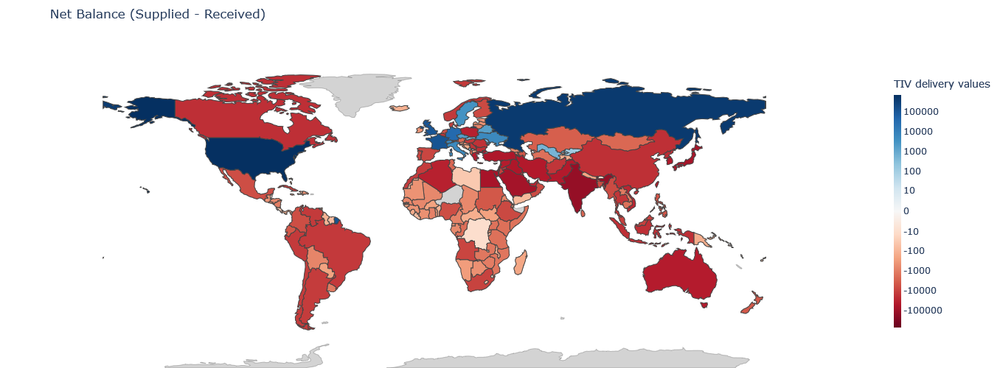

In [94]:
map_plotter.plot_choropleth()

In [95]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Net Balance',
    date_column='Delivery year',
    year='Overall',
    region_type='Organisation',
    arms_category='All',
    unit='TIV delivery values'
)

map_plotter.plot_choropleth()

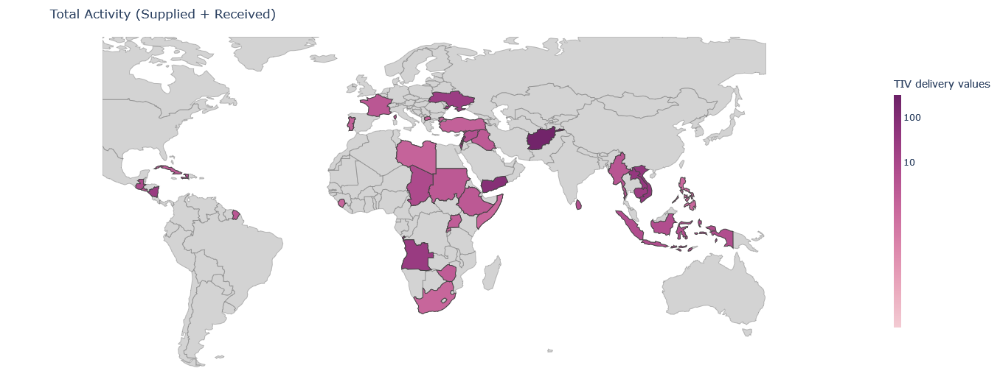

In [96]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Total Activity',
    date_column='Delivery year',
    year='Overall',
    region_type='Rebel Group',
    arms_category='All',
    unit='TIV delivery values'
)

map_plotter.plot_choropleth()

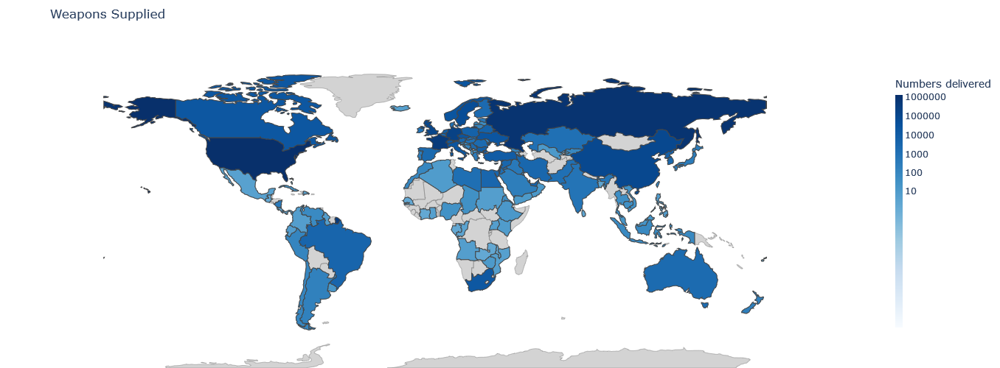

In [97]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Supplied',
    date_column='Delivery year',
    year='Overall',
    region_type='Country',
    arms_category='All',
    unit='Numbers delivered'
)

map_plotter.plot_choropleth()

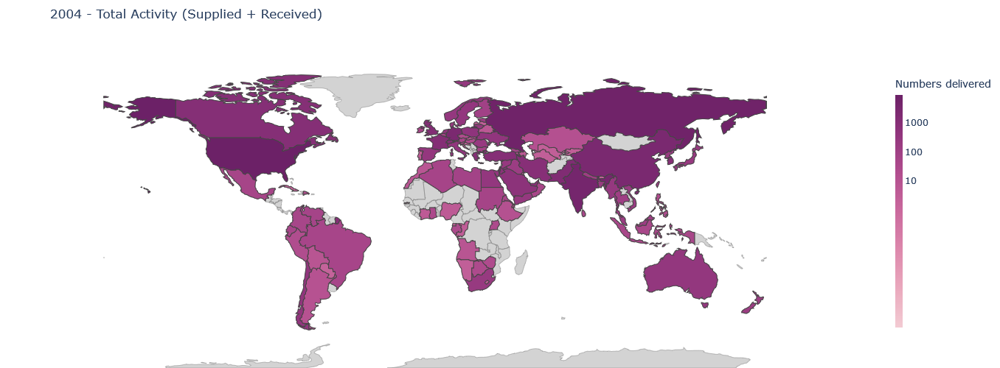

In [98]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Total Activity',
    date_column='Delivery year',
    year=2004,
    region_type='Country',
    arms_category='All',
    unit='Numbers delivered'
)

map_plotter.plot_choropleth()

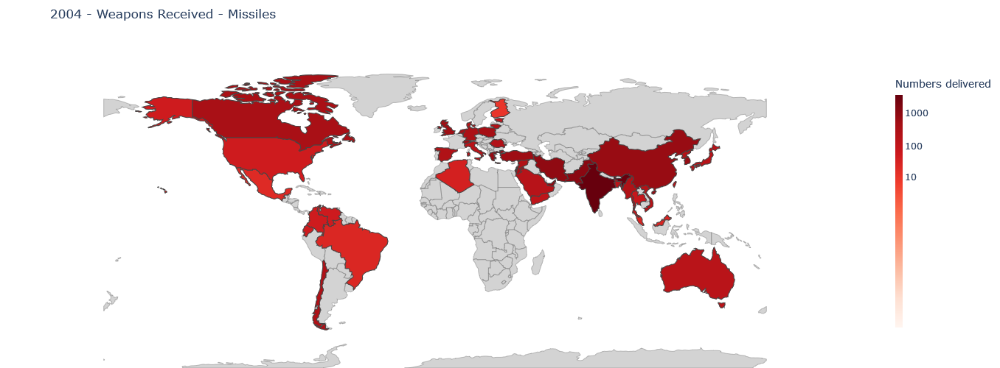

In [99]:
map_plotter = MapPlotterGlobal(
    df=arms_trade_data,
    activity='Received',
    date_column='Delivery year',
    year=2004,
    region_type='Country',
    arms_category='Missiles',
    unit='Numbers delivered'
)

map_plotter.plot_choropleth()

### By Region

In [100]:
import plotly.graph_objects as go

In [101]:
arms_trade_data.columns

Index(['Armament category', 'Delivery year', 'Delivery year is estimate',
       'Description', 'Designation', 'ID', 'Local production',
       'Numbers delivered', 'Numbers delivered is estimate',
       'Order date is estimate', 'Order year', 'Recipient', 'Recipient_iso_a3',
       'Recipient_region_type', 'SIPRI estimate', 'Status', 'Supplier',
       'Supplier_iso_a3', 'Supplier_region_type', 'TIV deal unit',
       'TIV delivery values'],
      dtype='object')

In [102]:
class MapPlotterRegion:
    def __init__(
        self,
        df,
        region,
        activity,
        date_column,
        year,
        region_type,
        arms_category,
        unit
    ):
        self.df=df
        self.region=region
        self.activity=activity
        self.date_column=date_column
        self.year=year
        self.region_type=region_type
        self.arms_category=arms_category
        self.unit=unit

    def plot_choropleth(self):
        self.prepare_plot_data()
        self.get_plot_dict()

        # Convert the filtered GeoDataFrame to GeoJSON format
        data_geojson = self.data.__geo_interface__
    
        # Create an interactive map using Plotly
        fig = px.choropleth(self.data,
                            geojson=data_geojson,
                            locations='Region',
                            featureidkey="properties.Region",
                            projection="equirectangular",
                            title=self.plot_dict['title'],
                            color=f"log {self.unit}",
                            color_continuous_scale=self.plot_dict['color_scale'],
                            color_continuous_midpoint=0
                           )
    
        fig.update_layout(
            width=1000,
            height=500,
            margin={"r":0, "t":50, "l":0, "b":0},
            showlegend=False,
            coloraxis_colorbar=dict(
                title=f"{self.unit}",
                tickvals=self.plot_dict['cbar_tickvals'],
                ticktext=self.plot_dict['cbar_ticktext'],
                len=0.8,
                thickness=10
            ),
            
        # fill in coutries with no activity in gray
        geo = dict(
            landcolor = 'lightgray',
            showland = True,
            showcountries = True,
            countrycolor = 'gray',
            countrywidth = 0.5,
            )
        )
    
        fig.update_geos(fitbounds="locations", visible=False)
        
        # Customize the hover template to show only the country name
        fig.update_traces(
            hovertemplate=self.plot_dict['hovertemplate'],
            customdata=self.plot_dict['customdata'],
        )

       # Highlight selected country
        selected_country_df = world_map_data[world_map_data['iso_a3'] == self.iso_a3]
        geometry = selected_country_df.geometry.iloc[0]
        
        if str(type(geometry))=="<class 'shapely.geometry.polygon.Polygon'>":
            coords = geometry.exterior.coords.xy
            lon = coords[0].tolist()
            lat = coords[1].tolist()
            fig.add_trace(
                go.Scattergeo(
                    lon=lon,
                    lat=lat,
                    mode='lines',
                    fill='toself',
                    line=dict(width=2, color='green'),
                    text=self.region,
                    hoverinfo="text"
                )
            )
        else:
            selected_country_df = selected_country_df.explode(index_parts=True)
            for index, row in selected_country_df.iterrows():
                geometry = row['geometry']
                coords = geometry.exterior.coords.xy
                lon = coords[0].tolist()
                lat = coords[1].tolist()
                fig.add_trace(
                    go.Scattergeo(
                        lon=lon,
                        lat=lat,
                        mode='lines',
                        fill='toself',
                        line=dict(width=2, color='green'),
                        text=self.region,
                        hoverinfo="text"
                    )
                )
            
        return fig
        
    def prepare_plot_data(self):
        self.filter_data()
        self.calculate_totals()
        self.filter_region_type()
        self.merge_geolocation_data()
        self.get_region_iso_a3()

    def filter_data(self):
        self.data = self.df.copy()
        
        if self.year != 'Overall':
            self.data=self.data[self.data[self.date_column]==int(self.year)]
        if self.arms_category != 'All':
            self.data=self.data[self.data['Armament category']==self.arms_category]
        if self.region:
            if self.activity=='Supplied':
                self.data=self.data[self.data['Supplier']==self.region]
                self.data=self.data[self.data['Recipient_region_type']==self.region_type]
            elif self.activity=='Received':
                self.data=self.data[self.data['Recipient']==self.region]
            else:
                self.data=self.data[(self.data['Supplier']==self.region) | (self.data['Recipient']==self.region)]

    def calculate_totals(self):
        if self.activity=="Supplied":
            self.data=self.data.groupby(["Recipient", "Recipient_iso_a3", "Recipient_region_type"])[self.unit].sum().reset_index()
            self.data.rename(columns={'Recipient':'Region', 'Recipient_iso_a3':'iso_a3', 'Recipient_region_type':'Region_type'}, inplace=True)
        elif self.activity=="Received":
            self.data=self.data.groupby(["Supplier", "Supplier_iso_a3", "Supplier_region_type"])[self.unit].sum().reset_index()
            self.data.rename(columns={'Supplier':'Region', 'Supplier_iso_a3':'iso_a3', 'Supplier_region_type':'Region_type'}, inplace=True)
        else:
            # note switch supplier and receiver compared to global
            received=self.data.groupby(["Supplier", "Supplier_iso_a3", "Supplier_region_type"])[self.unit].sum().reset_index().rename(columns={self.unit:'Supplied'})
            supplied=self.data.groupby(["Recipient", "Recipient_iso_a3", "Recipient_region_type"])[self.unit].sum().reset_index().rename(columns={self.unit:'Received'})
            self.data=pd.merge(
                left=supplied,
                right=received,
                how='outer',
                right_on=["Supplier", "Supplier_iso_a3", "Supplier_region_type"],
                left_on=["Recipient", "Recipient_iso_a3", "Recipient_region_type"]
            )
    
            # fill in null values and names
            self.data=self.data.fillna(0)
            self.data['Region']=self.data.apply(lambda row: row['Recipient'] if row['Recipient']!=0 else row['Supplier'], axis=1)
            self.data['iso_a3']=self.data.apply(lambda row: row['Recipient_iso_a3'] if row['Recipient_iso_a3']!=0 else row['Supplier_iso_a3'], axis=1)
            self.data['Region_type']=self.data.apply(lambda row: row['Recipient_region_type'] if row['Recipient_region_type']!=0 else row['Supplier_region_type'], axis=1)
            self.data.drop(columns=["Supplier", "Recipient", "Supplier_iso_a3", "Recipient_iso_a3", "Supplier_region_type", "Recipient_region_type"], inplace=True)
    
            if self.activity=="Net Balance":
                self.data[self.unit]=self.data["Received"]-self.data["Supplied"]
            elif self.activity=="Total Activity":
                self.data[self.unit]=self.data["Supplied"]+self.data["Received"]

        # drop data for chosen region
        if self.region:
            self.data=self.data[self.data['Region']!=self.region].copy()
        
        # Apply the signed log transformation to the units
        self.data[f'log {self.unit}'] = self.data[self.unit].apply(signed_log)

    def filter_region_type(self):
        if self.region_type != "All regions":
            if self.region_type == "Country":
                self.data = self.data[self.data['Region_type'].isin(['Country', 'Former Country'])].copy()
            else:
                self.data = self.data[self.data['Region_type']==self.region_type]

    def merge_geolocation_data(self):
        # merge with geolocation data
        self.data = pd.merge(world_map_data, self.data, how='left', on=['iso_a3'])
        self.data['Region'] = self.data.apply(lambda row: row['name'] if row['Region_type'] in ['Country', 'Former Country'] else row['Region'], axis=1) 

    def get_plot_dict(self):
        title = f"{self.region} - "
        if self.year != "Overall":
            title += f"{str(self.year)} - "
        
        if self.activity=='Supplied':
                color_scale = px.colors.sequential.Blues
                title += "Weapons Supplied to other regions"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata:.2f}}<extra></extra>"
                customdata=np.stack(self.data[self.unit])
        elif self.activity=='Received':
                color_scale = px.colors.sequential.Reds
                title += "Weapons Received from other regions"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit]))
        elif self.activity=='Net Balance':
                color_scale = px.colors.sequential.RdBu
                title += "Net Balance (Supplied - Received)"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata[0]:.2f}}<br>Supplied by {self.region}: %{{customdata[1]:.2f}}<br>Received from other regions: %{{customdata[2]:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit], self.data['Supplied'],self.data['Received'],), axis=-1)
        elif self.activity=='Total Activity':
                color_scale = px.colors.sequential.Magenta
                title += "Total Activity (Supplied + Received)"
                hovertemplate=f"<b>%{{location}}</b><br>{self.unit}: %{{customdata[0]:.2f}}<br>Supplied by {self.region}: %{{customdata[1]:.2f}}<br>Received from other regions: %{{customdata[2]:.2f}}<extra></extra>"
                customdata=np.stack((self.data[self.unit], self.data['Supplied'],self. data['Received']), axis=-1)
    
        if self.arms_category != "All":
            title += f" - {self.arms_category}"

        tickvals, ticktext = self.get_cbar_ticks()
        
        self.plot_dict = {
            'color_scale':color_scale,
            'title':title,
            'hovertemplate':hovertemplate,
            'customdata':customdata,
            'cbar_tickvals':tickvals,
            'cbar_ticktext':ticktext
        }

    def get_cbar_ticks(self):
        if self.activity == "Net Balance":
            max_abs_value = self.data[self.unit].abs().max()
            max_abs_value = round(max_abs_value, -int(math.floor(math.log10(abs(max_abs_value)))))
            max_abs_value = 10 ** (int(math.log10(max_abs_value) + 1))
            powers_of_10_pos = [10**i for i in range(1, int(math.log10(max_abs_value) + 1))]
            powers_of_10_neg = [-x for x in powers_of_10_pos]
            powers_of_10 = sorted(powers_of_10_neg + [0] + powers_of_10_pos)

            tickvals=signed_log(np.array(powers_of_10))
            ticktext=powers_of_10
        else :
            max_abs_value = self.data[self.unit].abs().max()
            max_abs_value = round(max_abs_value, -int(math.floor(math.log10(abs(max_abs_value)))))
            max_abs_value = 10 ** (int(math.log10(max_abs_value) + 1))
            powers_of_10 = [10**i for i in range(1, int(math.log10(max_abs_value) + 1))]

            tickvals=signed_log(np.array(powers_of_10))
            ticktext=powers_of_10

        return tickvals, ticktext

    def get_region_iso_a3(self):
        try:
            self.iso_a3=arms_trade_data[arms_trade_data['Supplier']==self.region].Supplier_iso_a3.unique()[0]
        except:
            self.iso_a3=arms_trade_data[arms_trade_data['Recipient']==self.region].Recipient_iso_a3.unique()[0]
        

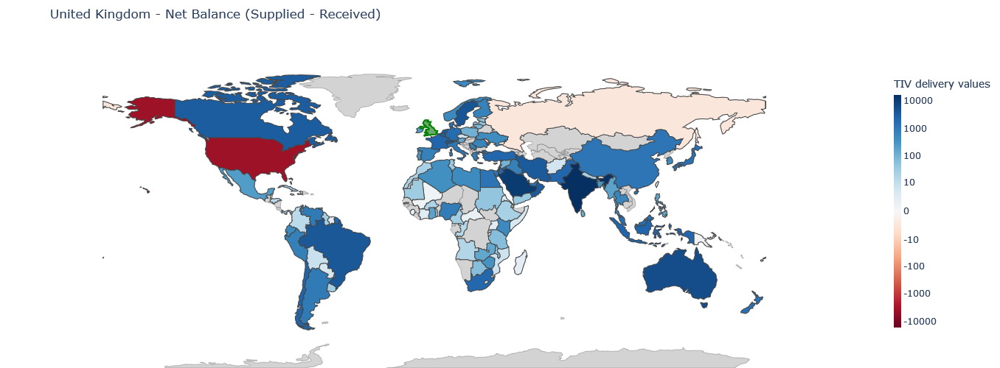

In [103]:
map_plotter = MapPlotterRegion(
    df=arms_trade_data,
    region='United Kingdom',
    activity='Net Balance',
    date_column='Delivery year',
    year='Overall',
    region_type='Country',
    arms_category='All',
    unit='TIV delivery values'
)

map_plotter.plot_choropleth()

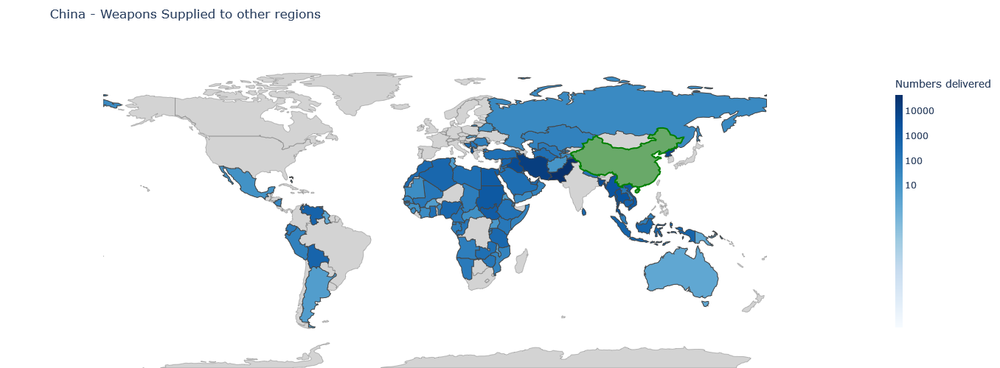

In [104]:
map_plotter = MapPlotterRegion(
    df=arms_trade_data,
    region='China',
    activity='Supplied',
    date_column='Delivery year',
    year='Overall',
    region_type='Country',
    arms_category='All',
    unit='Numbers delivered'
)

map_plotter.plot_choropleth()

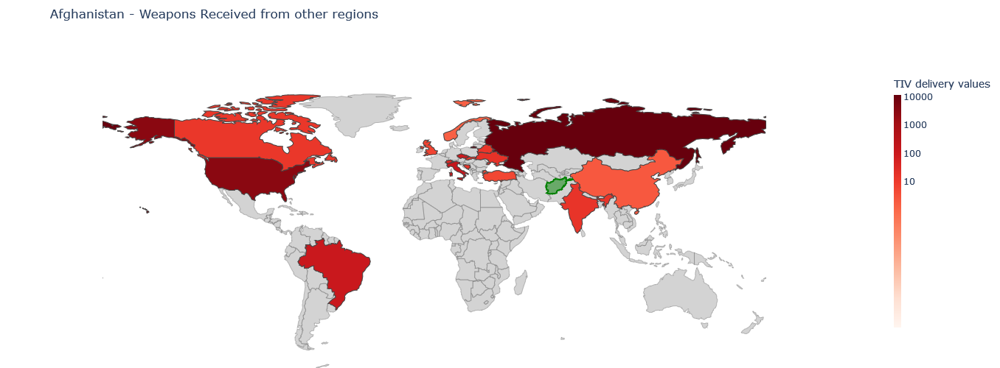

In [105]:
map_plotter = MapPlotterRegion(
    df=arms_trade_data,
    region='Afghanistan',
    activity='Received',
    date_column='Delivery year',
    year='Overall',
    region_type='Country',
    arms_category='All',
    unit='TIV delivery values'
)

map_plotter.plot_choropleth()

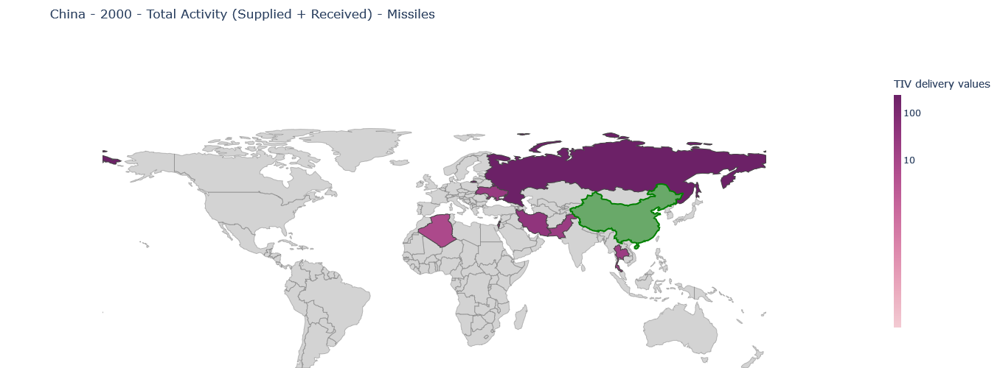

In [106]:
map_plotter = MapPlotterRegion(
    df=arms_trade_data,
    region='China',
    activity='Total Activity',
    date_column='Delivery year',
    year=2000,
    region_type='Country',
    arms_category='Missiles',
    unit='TIV delivery values'
)

map_plotter.plot_choropleth()